# HandVerify: Handwriting Verification via Siamese CNN with Direct Binary Supervision

**HandVerify** è un sistema di verifica biometrica basato sulla scrittura a mano, progettato per determinare se due testi manoscritti (anche con contenuti diversi) siano stati prodotti dalla stessa persona.  
Il modello si basa su un approccio **Siamese Convolutional Neural Network (CNN)** con **classificazione binaria diretta (BCE + Sigmoid)**, senza utilizzare Contrastive Learning.  

Invece di costruire uno spazio metrico, il modello impara a predire direttamente la probabilità che due scritture appartengano allo stesso autore.  
Questo approccio supervisionato end-to-end sfrutta le feature estratte da ResNet18 per catturare le caratteristiche stilistiche della scrittura, permettendo una verifica accurata delle coppie di immagini.


### **Overview**
This section processes the IAM Handwritten Forms Dataset, extracting the handwritten text region between the second and third horizontal lines. We apply:
- Otsu binarization for thresholding
- Morphological operations to detect horizontal lines
- Tight cropping to remove whitespace
- Resizing to 448×448 (2× standard 224 for better detail)

### **Why These Steps?**
- **Line detection**: Forms have multiple horizontal lines; we want only the main text
- **Cropping**: Removes irrelevant margins, focuses the model on actual writing
- **Binarization**: Simplifies the problem by removing background noise

## 1. Datasets Preprocessing

In [ ]:
import cv2
import os
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
from tqdm import tqdm
from concurrent.futures import ProcessPoolExecutor, as_completed
from collections import defaultdict
import multiprocessing

# ==================== CONFIGURAZIONE ====================
TARGET_SIZE = 448
NUM_WORKERS = min(8, multiprocessing.cpu_count())
LINE_HEIGHT = 32
LINES_PER_BATCH = TARGET_SIZE // LINE_HEIGHT

IAM_INPUT = "/kaggle/input/iam-handwritten-forms-dataset/data"
IAM_OUTPUT = "dataset/handwritten_processed"
RIMES_INPUT = "/kaggle/input/handwritten2text-training-dataset/Handwritten2Text Training Dataset/Images"
RIMES_OUTPUT = "dataset/rimes_processed"

In [ ]:
# ==================== FUNZIONI COMUNI ====================
def apply_threshold(image):
    """Otsu's binarization"""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) if len(image.shape) == 3 else image
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return binary

def tight_crop(binary_image, padding=5):
    """Crop basato su contenuto con padding"""
    binary_inv = 255 - binary_image
    row_sums = np.sum(binary_inv > 0, axis=1)
    col_sums = np.sum(binary_inv > 0, axis=0)
    
    text_rows = np.where(row_sums > 0)[0]
    text_cols = np.where(col_sums > 0)[0]
    
    if len(text_rows) == 0 or len(text_cols) == 0:
        return None
    
    y1, y2 = text_rows[0], text_rows[-1]
    x1, x2 = text_cols[0], text_cols[-1]
    
    h, w = binary_image.shape
    return binary_image[
        max(0, y1-padding):min(h, y2+padding),
        max(0, x1-padding):min(w, x2+padding)
    ]

def resize_to_square(image, size=TARGET_SIZE):
    """Resize mantenendo aspect ratio in canvas quadrato"""
    h, w = image.shape
    side = max(h, w)
    square = np.full((side, side), 255, dtype=np.uint8)
    y_off, x_off = (side - h) // 2, (side - w) // 2
    square[y_off:y_off+h, x_off:x_off+w] = image
    return cv2.resize(square, (size, size), interpolation=cv2.INTER_AREA)

def visualize_samples(output_folder, filename, n_samples=18, figsize=(25, 30)):
    """Visualizza campioni da diverse cartelle"""
    sample_folders = sorted(os.listdir(output_folder))[:n_samples]
    n_cols = 3
    n_rows = (n_samples + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    axes = axes.flatten() if n_samples > 1 else [axes]
    
    for idx, folder in enumerate(sample_folders):
        folder_path = os.path.join(output_folder, folder)
        images = [f for f in os.listdir(folder_path) if f.endswith('.png')]
        
        if images:
            img = cv2.imread(os.path.join(folder_path, images[0]), cv2.IMREAD_GRAYSCALE)
            axes[idx].imshow(img, cmap='gray')
            axes[idx].set_title(f'Writer {folder}\nSize: {img.shape}')
            axes[idx].axis('off')
    
    plt.tight_layout()
    plt.savefig(filename, dpi=150, bbox_inches='tight')
    plt.show()

### IAM Preprocessing Pipeline

In [ ]:
def extract_handwritten_region_iam(image_path):
    """Estrae regione tra 2a e 3a linea orizzontale"""
    image = cv2.imread(image_path)
    if image is None:
        return None
    
    binary = apply_threshold(image)
    thresh_inv = 255 - binary
    
    # Rileva linee orizzontali
    kernel = np.ones((1, 50), np.uint8)
    black_lines = cv2.morphologyEx(thresh_inv, cv2.MORPH_OPEN, kernel, iterations=2)
    contours, _ = cv2.findContours(black_lines, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    if len(contours) < 2:
        return None
    
    contours = sorted(contours, key=lambda c: cv2.boundingRect(c)[1])
    _, y2, _, h2 = cv2.boundingRect(contours[1])
    
    y_end = cv2.boundingRect(contours[2])[1] if len(contours) >= 3 else binary.shape[0]
    return binary[y2 + h2:y_end, :]

def process_iam_image(args):
    """Processa singola immagine IAM"""
    image_path, output_path = args
    try:
        handwritten = extract_handwritten_region_iam(image_path)
        if handwritten is None or handwritten.size == 0:
            return False
        
        cropped = tight_crop(handwritten, padding=10)
        if cropped is None:
            return False
        
        final = resize_to_square(cropped)
        cv2.imwrite(output_path, final)
        return True
    except Exception:
        return False

"""Pipeline completa IAM"""
os.makedirs(IAM_OUTPUT, exist_ok=True)

# Prepara task
tasks = []
for folder in sorted(os.listdir(IAM_INPUT)):
    folder_path = os.path.join(IAM_INPUT, folder)
    if not os.path.isdir(folder_path):
        continue
    
    output_subfolder = os.path.join(IAM_OUTPUT, folder)
    os.makedirs(output_subfolder, exist_ok=True)
    
    for img_name in os.listdir(folder_path):
        if img_name.endswith(('.png', '.jpg', '.jpeg')):
            tasks.append((
                os.path.join(folder_path, img_name),
                os.path.join(output_subfolder, f"{Path(img_name).stem}.png")
            ))

print(f"🔄 Processing {len(tasks)} IAM images with {NUM_WORKERS} workers...")

# Elaborazione parallela
processed = skipped = 0
with ProcessPoolExecutor(max_workers=NUM_WORKERS) as executor:
    futures = {executor.submit(process_iam_image, task): task for task in tasks}
    for future in tqdm(as_completed(futures), total=len(tasks), desc="IAM"):
        if future.result():
            processed += 1
        else:
            skipped += 1

print(f"✅ IAM Complete! Processed: {processed} | Skipped: {skipped}\n")

# Visualizza
visualize_samples(IAM_OUTPUT, 'iam_samples.png', n_samples=6, figsize=(15, 10))
print(f"📊 Writers: {len(os.listdir(IAM_OUTPUT))} | Output: {IAM_OUTPUT}\n")

### RIMES Preprocessing Pipeline

In [ ]:
def preprocess_rimes_line(image):
    """Preprocessa singola linea RIMES (resize a LINE_HEIGHT × TARGET_SIZE)"""
    binary = apply_threshold(image)
    cropped = tight_crop(binary, padding=5)
    
    if cropped is None:
        return None
    
    # Resize a altezza fissa
    h, w = cropped.shape
    new_w = int(w * LINE_HEIGHT / h)
    resized = cv2.resize(cropped, (new_w, LINE_HEIGHT), interpolation=cv2.INTER_AREA)
    
    # Padding larghezza
    if new_w > TARGET_SIZE:
        resized = resized[:, :TARGET_SIZE]
    else:
        canvas = np.full((LINE_HEIGHT, TARGET_SIZE), 255, dtype=np.uint8)
        canvas[:, :new_w] = resized
        resized = canvas
    
    return resized

In [ ]:
"""Pipeline completa RIMES"""
os.makedirs(RIMES_OUTPUT, exist_ok=True)

# Raggruppa per writer
writer_images = defaultdict(list)
print("📂 Scanning RIMES dataset...")

for img_name in tqdm(sorted(os.listdir(RIMES_INPUT))):
    if not img_name.endswith(('.jpg', '.png', '.jpeg')):
        continue
    
    parts = img_name.split('-')
    if len(parts) < 2:
        continue
    
    writer_id = parts[1].split('_')[0]
    writer_images[writer_id].append(os.path.join(RIMES_INPUT, img_name))

print(f"✅ Found {len(writer_images)} writers\n")

# Processa per writer
total_batches = 0
for writer_id, image_paths in tqdm(writer_images.items(), desc="RIMES writers"):
    writer_folder = os.path.join(RIMES_OUTPUT, writer_id)
    os.makedirs(writer_folder, exist_ok=True)
    
    # Preprocessa linee
    lines = []
    for img_path in image_paths:
        img = cv2.imread(img_path)
        if img is not None:
            line = preprocess_rimes_line(img)
            if line is not None:
                lines.append(line)
    
    if not lines:
        continue
    
    # Crea batch
    for i in range(0, len(lines), LINES_PER_BATCH):
        batch = np.vstack(lines[i:i + LINES_PER_BATCH])
        canvas = np.full((TARGET_SIZE, TARGET_SIZE), 255, dtype=np.uint8)
        canvas[:batch.shape[0], :] = batch
        
        cv2.imwrite(
            os.path.join(writer_folder, f"batch_{total_batches:03d}.png"),
            canvas
        )
        total_batches += 1

print(f"✅ RIMES Complete! Writers: {len(writer_images)} | Batches: {total_batches}\n")

# Visualizza
visualize_samples(RIMES_OUTPUT, 'rimes_samples.png')
print(f"📊 Output: {RIMES_OUTPUT}\n")

## **2. Dataset Creation with Realistic Distribution**

### **Critical Design Decisions**

#### **2.1 Writer-Level Splitting (Not Image-Level)**
Traditional train/test splits shuffle individual images randomly. This is **fundamentally wrong** for writer verification because:
- The model memorizes writing styles of specific writers
- At test time, it sees the same writers it trained on (just different samples)
- This inflates accuracy artificially

**Our approach**: Split writers into disjoint sets before creating pairs. This ensures:
- Train set: Writers A, B, C, ...
- Validation set: Writers X, Y, Z, ... (never seen before)
- Test set: Writers P, Q, R, ... (completely new)

#### **2.2 Realistic Positive/Negative Ratio**
In real-world applications:
- **Positive pairs (same writer)**: ~10% - e.g., verifying a signature against a database
- **Negative pairs (different writers)**: ~90% - most comparisons are rejections

Balanced 50/50 datasets make the model lazy (always guesses "different" → 50% accuracy for free)

#### **2.3 Augmentation Strategy**
**Removed dangerous augmentations**:
- ❌ Horizontal flip → Creates mirror writing (doesn't exist)
- ❌ Vertical flip → Upside-down text (meaningless)

**Kept valid augmentations**:
- ✅ Rotation (±10°) → Natural paper tilt
- ✅ Slight scaling (0.9-1.1×) → Different scan resolutions
- ✅ Random crops → Simulates partial documents

In [8]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import numpy as np
import random
from sklearn.model_selection import train_test_split

TARGET_SIZE = 224 * 2
NUM_WORKERS = 4
BATCH_SIZE = 16
POSITIVE_RATIO = 0.1  # 10% positive, 90% negative (realistic)
PAIRS_PER_WRITER = 100

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda


In [9]:
class SiameseDataset(Dataset):
    def __init__(self, writer_dirs, split='train', positive_ratio=0.1, pairs_per_writer=100, target_size=TARGET_SIZE):
        """
        Args:
            writer_dirs: List of writer directories
            split: 'train', 'val', or 'test'
            positive_ratio: Proportion of positive pairs (same writer)
            pairs_per_writer: Number of pairs to generate per writer
        """
        self.writer_dirs = writer_dirs
        self.positive_ratio = positive_ratio
        self.split = split
        self.target_size = target_size
        
        # CRITICAL: Different augmentations for train vs val/test
        if self.split == 'train':
            self.augment = transforms.Compose([
                transforms.RandomResizedCrop(self.target_size, scale=(0.9, 1.1)),
                transforms.RandomRotation(10),  # ±10° (realistic paper tilt)
                transforms.ToTensor()
            ])
        else:
            # Val/Test: No augmentation, just resize
            self.augment = transforms.Compose([
                transforms.Resize((self.target_size, self.target_size)),
                transforms.ToTensor()
            ])
        
        # Load images per writer
        self.writer_images = {}
        for writer_dir in writer_dirs:
            writer_id = Path(writer_dir).name
            images = [os.path.join(writer_dir, f) for f in os.listdir(writer_dir)
                     if f.endswith('.png')]
            if len(images) >= 2:  # Need at least 2 images for pairs
                self.writer_images[writer_id] = images
        
        self.writer_ids = list(self.writer_images.keys())
        self.num_pairs = len(self.writer_ids) * pairs_per_writer
        
        print(f"{split.upper()} SET: {len(self.writer_ids)} writers, {self.num_pairs} pairs "
              f"({positive_ratio*100:.0f}% positive)")
    
    def __len__(self):
        return self.num_pairs
    
    def __getitem__(self, idx):
        is_positive = random.random() < self.positive_ratio
        
        if is_positive:
            # Same writer, different documents
            writer_id = random.choice(self.writer_ids)
            img1_path, img2_path = random.sample(self.writer_images[writer_id], 2)
            label = 1.0
        else:
            # Different writers
            writer1, writer2 = random.sample(self.writer_ids, 2)
            img1_path = random.choice(self.writer_images[writer1])
            img2_path = random.choice(self.writer_images[writer2])
            label = 0.0
        
        # Load and transform images
        img1 = Image.open(img1_path).convert("L")
        img2 = Image.open(img2_path).convert("L")
        
        img1 = self.augment(img1)
        img2 = self.augment(img2)
        
        return img1, img2, torch.tensor(label, dtype=torch.float32)

## **3. Data Splitting Strategy**

### **Three-Way Writer-Level Split**

We perform a rigorous split that ensures complete writer independence:

1. **Train (70%)**: Writers used to learn style patterns
2. **Validation (15%)**: Writers for hyperparameter tuning and early stopping
3. **Test (15%)**: Writers held out completely until final evaluation

### **Why This Matters**

Consider a dataset with 100 writers, 10 documents each (1000 documents total):

**❌ Wrong approach (image-level split)**:
- Train: 700 random documents
- Test: 300 random documents
- Problem: Test set contains documents from writers seen in training
- Result: Model memorizes writer styles → **Artificially high accuracy**

**✅ Correct approach (writer-level split)**:
- Train: 70 writers (all their documents)
- Val: 15 writers (all their documents)
- Test: 15 writers (all their documents)
- Result: Model generalizes to **completely new writers**

In [10]:
from pathlib import Path

# Load all writer directories
data_root = "dataset/handwritten_processed"
writer_dirs = [os.path.join(data_root, d) for d in sorted(os.listdir(data_root))
               if os.path.isdir(os.path.join(data_root, d))]

print(f"Total writers found: {len(writer_dirs)}")

# CRITICAL: Split at writer level (not image level)
train_dirs, temp_dirs = train_test_split(writer_dirs, test_size=0.3, random_state=42)
val_dirs, test_dirs = train_test_split(temp_dirs, test_size=0.5, random_state=42)

print(f"\n📊 Writer Distribution:")
print(f"  Train: {len(train_dirs)} writers (70%)")
print(f"  Val:   {len(val_dirs)} writers (15%)")
print(f"  Test:  {len(test_dirs)} writers (15%)")
print(f"  ✓ No overlap between splits!")

Total writers found: 657

📊 Writer Distribution:
  Train: 459 writers (70%)
  Val:   99 writers (15%)
  Test:  99 writers (15%)
  ✓ No overlap between splits!


In [11]:
# Create datasets with realistic distribution (10% positive, 90% negative)
train_dataset = SiameseDataset(train_dirs, split='train', positive_ratio=POSITIVE_RATIO, 
                               pairs_per_writer=100)
val_dataset = SiameseDataset(val_dirs, split='val', positive_ratio=POSITIVE_RATIO, 
                             pairs_per_writer=100)
test_dataset = SiameseDataset(test_dirs, split='test', positive_ratio=POSITIVE_RATIO, 
                              pairs_per_writer=100)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,
                          num_workers=NUM_WORKERS, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False,
                        num_workers=NUM_WORKERS, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False,
                         num_workers=NUM_WORKERS, pin_memory=True)

print(f"\n📦 Dataset Sizes:")
print(f"  Train: {len(train_dataset)} pairs")
print(f"  Val:   {len(val_dataset)} pairs")
print(f"  Test:  {len(test_dataset)} pairs")

TRAIN SET: 218 writers, 21800 pairs (10% positive)
VAL SET: 43 writers, 4300 pairs (10% positive)
TEST SET: 40 writers, 4000 pairs (10% positive)

📦 Dataset Sizes:
  Train: 21800 pairs
  Val:   4300 pairs
  Test:  4000 pairs


## **4. Model Architecture - Siamese ResNet50**

### **Why Siamese Networks?**

Traditional classification approaches assign each writer a class label (Writer 1, Writer 2, ...). This fails when:
- New writers appear at test time (can't add classes dynamically)
- We need to compare any two samples (not just classify individuals)

**Siamese architecture**:
1. Two identical encoder branches (shared weights)
2. Each encodes one handwriting sample into a feature vector
3. Features are concatenated and passed to a binary classifier
4. Output: Probability that both samples are from the same writer

### **Why ResNet50?**
- Pre-trained on ImageNet (transfer learning)
- Residual connections prevent vanishing gradients
- 50 layers provide sufficient capacity for complex patterns
- Modified for grayscale input (1 channel instead of 3)

### **Architecture Details**
```python
Input: 2 grayscale images (448×448)
  ↓
ResNet50 Encoder (shared weights)
  ↓
Feature vectors: 2048-dim each
  ↓
Concatenate: 4096-dim
  ↓
Fully Connected Layers:
  4096 → 1024 (BN, ReLU, Dropout 0.4)
  1024 → 512  (BN, ReLU, Dropout 0.4)
  512  → 256  (BN, ReLU, Dropout 0.3)
  256  → 1    (Sigmoid)
  ↓
Output: Probability [0, 1]
```

In [13]:
PROJECTION_LAYER = 1024

In [14]:
def build_fc_block(input_dim, projection_dim=PROJECTION_LAYER):
    """Crea il blocco fully connected condiviso da tutte le architetture."""
    return nn.Sequential(
        nn.Linear(input_dim, projection_dim),
        nn.BatchNorm1d(projection_dim),
        nn.ReLU(inplace=True),
        nn.Dropout(0.4),

        nn.Linear(projection_dim, 512),
        nn.BatchNorm1d(512),
        nn.ReLU(inplace=True),
        nn.Dropout(0.4),

        nn.Linear(512, 256),
        nn.BatchNorm1d(256),
        nn.ReLU(inplace=True),
        nn.Dropout(0.3),

        nn.Linear(256, 1),
        nn.Sigmoid()
    )

In [24]:
from torchvision.models import mobilenet_v3_small, MobileNet_V3_Small_Weights

class SiameseMobileNet(nn.Module):
    def __init__(self):
        super().__init__()
        mobilenet = mobilenet_v3_small(weights=MobileNet_V3_Small_Weights.DEFAULT)
        mobilenet.features[0][0] = nn.Conv2d(1, 16, kernel_size=3, stride=2, padding=1, bias=False)
        self.encoder = nn.Sequential(mobilenet.features, nn.AdaptiveAvgPool2d(1))
        
        self.fc = build_fc_block(1152)
    
    def forward_one(self, x):
        x = self.encoder(x)
        return x.view(x.size(0), -1)
    
    def forward(self, img1, img2):
        feat1 = self.forward_one(img1)
        feat2 = self.forward_one(img2)
        combined = torch.cat([feat1, feat2], dim=1)
        return self.fc(combined)

## **5. Advanced Evaluation Metrics**

### **Why Accuracy Alone is Insufficient**

Consider a dataset with 10% positive pairs and 90% negative pairs:
- A model that **always predicts "different"** gets 90% accuracy!
- This is useless in practice

### **Comprehensive Metrics**

#### **5.1 Precision, Recall, F1-Score**
- **Precision**: Of pairs predicted as "same writer", how many are correct?
  - Critical for minimizing false acceptances (security risk)
- **Recall**: Of actual "same writer" pairs, how many did we catch?
  - Critical for not rejecting legitimate users
- **F1**: Harmonic mean (balances precision and recall)

#### **5.2 ROC-AUC (Receiver Operating Characteristic)**
- Plots True Positive Rate vs False Positive Rate at all thresholds
- **AUC = 1.0**: Perfect discrimination
- **AUC = 0.5**: Random guessing
- **AUC > 0.9**: Excellent model

#### **5.3 EER (Equal Error Rate)**
- Threshold where False Accept Rate = False Reject Rate
- Industry standard for biometric systems
- **Lower is better** (typically aim for <5%)

#### **5.4 Precision@K**
- For retrieval scenarios: "Of the top-K most similar samples, how many are correct?"
- Example: User uploads a signature → system shows top 5 matches from database

In [31]:
from sklearn.metrics import (accuracy_score, precision_score, recall_score, 
                             f1_score, roc_auc_score, roc_curve)
import pandas as pd

def calculate_eer(y_true, y_scores):
    """
    Calculate Equal Error Rate (EER)
    
    EER is the point where False Accept Rate = False Reject Rate
    """
    fpr, tpr, thresholds = roc_curve(y_true, y_scores)
    fnr = 1 - tpr  # False Negative Rate
    
    # Find threshold where FPR ≈ FNR
    eer_idx = np.nanargmin(np.abs(fpr - fnr))
    eer = (fpr[eer_idx] + fnr[eer_idx]) / 2
    eer_threshold = thresholds[eer_idx]
    
    return eer, eer_threshold

def evaluate_model(model, data_loader, split_name="Test", criterion=None):
    """
    Comprehensive evaluation with multiple metrics and average loss.
    """
    model.eval()
    all_labels = []
    all_preds = []
    all_scores = []  # Raw probabilities
    total_loss = 0.0
    num_batches = 0
    
    with torch.no_grad():
        for img1, img2, labels in tqdm(data_loader, desc=f"Evaluating {split_name}"):
            img1, img2, labels = img1.to(device), img2.to(device), labels.to(device)
            
            scores = model(img1, img2).squeeze()
            preds = (scores > 0.5).float()
            
            # Compute batch loss if criterion provided
            if criterion is not None:
                loss = criterion(scores, labels)
                total_loss += loss.item()
                num_batches += 1
            
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())
            all_scores.extend(scores.cpu().numpy())
    
    # Compute average validation loss
    avg_loss = total_loss / num_batches if num_batches > 0 else None
    
    all_labels = np.array(all_labels)
    all_preds = np.array(all_preds)
    all_scores = np.array(all_scores)
    
    # Calculate metrics
    accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, zero_division=0)
    recall = recall_score(all_labels, all_preds, zero_division=0)
    f1 = f1_score(all_labels, all_preds, zero_division=0)
    
    # ROC-AUC (requires probability scores)
    try:
        roc_auc = roc_auc_score(all_labels, all_scores)
    except:
        roc_auc = 0.0
    
    # EER
    eer, eer_thresh = calculate_eer(all_labels, all_scores)
    
    # Compile results
    metrics = {
        'split': split_name,
        'loss': avg_loss,
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1_score': f1,
        'roc_auc': roc_auc,
        'eer': eer,
        'eer_threshold': eer_thresh
    }
    
    return metrics, all_labels, all_preds, all_scores

## **6. Training Loop with Early Stopping**

### **Training Strategy**

#### **Optimizer: AdamW**
- Decoupled weight decay (more effective than L2 regularization)
- Learning rate: 3e-5 (smaller models) or 5e-5 (larger models)

#### **Scheduler: ReduceLROnPlateau**
- Monitors validation loss
- Reduces LR by 50% if no improvement for 2 epochs
- Helps escape plateaus without manual tuning

#### **Early Stopping**
- Stops training if validation loss doesn't improve for 5 epochs
- Prevents overfitting to the training set
- Saves best model checkpoint

#### **Loss Function: Binary Cross-Entropy (BCE)**
- Standard for binary classification (same writer: 1, different: 0)
- Works well with sigmoid output

In [32]:
import gc

def train_model(model, train_loader, val_loader, epochs=50, model_name="SiameseResNet50"):
    """
    Train Siamese network with full evaluation and proper validation loss tracking.
    """
    print(f"\n{'='*70}")
    print(f"Training {model_name}")
    print(f"{'='*70}\n")
    
    # === Setup ===
    results_folder = "results"
    os.makedirs(results_folder, exist_ok=True)
    
    criterion = nn.BCELoss()
    
    # Adaptive learning rate based on model size
    num_params = sum(p.numel() for p in model.parameters())
    lr = 3e-5 if num_params > 15e6 else 5e-5
    
    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=lr,
        weight_decay=1e-4,
        betas=(0.9, 0.999)
    )
    
    # Scheduler: reduce LR when validation loss stops improving
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode='min',      # monitor val_loss (to be minimized)
        factor=0.5,
        patience=2,
        verbose=True
    )
    
    # History tracking
    history = {
        'epoch': [],
        'train_loss': [],
        'train_acc': [],
        'val_loss': [],
        'val_acc': [],
        'val_f1': [],
        'val_roc_auc': []
    }
    
    best_val_loss = float('inf')
    patience_counter = 0
    patience = 5
    
    for epoch in range(epochs):
        # ===== TRAINING =====
        model.train()
        train_loss = 0.0
        train_preds, train_labels = [], []
        
        for img1, img2, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}"):
            img1, img2, labels = img1.to(device), img2.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs = model(img1, img2).squeeze()
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item()
            train_preds.extend((outputs > 0.5).cpu().numpy())
            train_labels.extend(labels.cpu().numpy())
        
        train_loss /= len(train_loader)
        train_acc = accuracy_score(train_labels, train_preds)
        
        # ===== VALIDATION =====
        val_metrics, _, _, _ = evaluate_model(model, val_loader, "Validation", criterion=criterion)
        
        # Update scheduler based on validation loss
        scheduler.step(val_metrics['loss'])
        
        # Save metrics
        history['epoch'].append(epoch + 1)
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_metrics['loss'])
        history['val_acc'].append(val_metrics['accuracy'])
        history['val_f1'].append(val_metrics['f1_score'])
        history['val_roc_auc'].append(val_metrics['roc_auc'])
        
        print(f"\nEpoch {epoch+1}/{epochs}:")
        print(f"  Train: Loss={train_loss:.4f}, Acc={train_acc:.4f}")
        print(f"  Val:   Loss={val_metrics['loss']:.4f}, Acc={val_metrics['accuracy']:.4f}, "
              f"F1={val_metrics['f1_score']:.4f}, AUC={val_metrics['roc_auc']:.4f}, "
              f"EER={val_metrics['eer']:.4f}")
        
        # ===== EARLY STOPPING =====
        if val_metrics['loss'] < best_val_loss:
            best_val_loss = val_metrics['loss']
            patience_counter = 0
            torch.save(model.state_dict(), f"{results_folder}/{model_name}_best.pth")
            print(f"  ✓ Saved best model (val_loss: {best_val_loss:.4f})")
        else:
            patience_counter += 1
            print(f"  Patience: {patience_counter}/{patience}")
            if patience_counter >= patience:
                print("\n⚠ Early stopping triggered.")
                break
    
    # ===== SAVE FINAL MODEL =====
    torch.save(model.state_dict(), f"{results_folder}/{model_name}_final.pth")
    pd.DataFrame(history).to_csv(f"{results_folder}/{model_name}_history.csv", index=False)
    
    print(f"\n✓ Training completed! Best val loss: {best_val_loss:.4f}")
    
    # Clean up GPU memory
    model.cpu()
    torch.cuda.empty_cache()
    gc.collect()
    
    return history, best_val_loss

## **7. Train the Model**

This cell executes the training loop. Expected training time:
- GPU (Tesla T4): ~30-45 minutes for 50 epochs
- CPU: ~4-6 hours (not recommended)

The model will automatically stop early if validation performance plateaus.

In [33]:
# Instantiate model
model = SiameseMobileNet().to(device)

# Count parameters
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"\n🔧 Model: SiameseMobileNet")
print(f"   Total parameters: {total_params:,}")
print(f"   Trainable parameters: {trainable_params:,}")

EPOCHS = 5

# Train model
history, best_val_loss = train_model(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    epochs=EPOCHS,
    model_name="MobileNet"
)

print("\n" + "="*70)
print("TRAINING COMPLETE")
print("="*70)

/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(



🔧 Model: SiameseMobileNet
   Total parameters: 2,767,361
   Trainable parameters: 2,767,361

Training MobileNet



Evaluating Validation: 100%|██████████| 269/269 [00:10<00:00, 26.58it/s]



Epoch 1/5:
  Train: Loss=0.3416, Acc=0.8944
  Val:   Loss=0.3177, Acc=0.9053, F1=0.3183, AUC=0.8612, EER=0.2250
  ✓ Saved best model (val_loss: 0.3177)


Evaluating Validation: 100%|██████████| 269/269 [00:10<00:00, 26.78it/s]



Epoch 2/5:
  Train: Loss=0.2474, Acc=0.9014
  Val:   Loss=0.2548, Acc=0.9028, F1=0.6294, AUC=0.9514, EER=0.1320
  ✓ Saved best model (val_loss: 0.2548)


Evaluating Validation: 100%|██████████| 269/269 [00:10<00:00, 26.71it/s]



Epoch 3/5:
  Train: Loss=0.2010, Acc=0.9146
  Val:   Loss=0.2049, Acc=0.9214, F1=0.6817, AUC=0.9631, EER=0.1003
  ✓ Saved best model (val_loss: 0.2049)


Evaluating Validation: 100%|██████████| 269/269 [00:10<00:00, 26.76it/s]



Epoch 4/5:
  Train: Loss=0.1792, Acc=0.9214
  Val:   Loss=0.1576, Acc=0.9351, F1=0.7360, AUC=0.9758, EER=0.0776
  ✓ Saved best model (val_loss: 0.1576)


Evaluating Validation: 100%|██████████| 269/269 [00:10<00:00, 26.77it/s]



Epoch 5/5:
  Train: Loss=0.1688, Acc=0.9258
  Val:   Loss=0.1594, Acc=0.9323, F1=0.7288, AUC=0.9754, EER=0.0669
  Patience: 1/5

✓ Training completed! Best val loss: 0.1576

TRAINING COMPLETE


## **8. Comprehensive Test Evaluation**

### **Test Set Analysis**

We evaluate the trained model on the held-out test set (writers never seen during training). This simulates real-world deployment where new writers constantly appear.

### **Intra-Writer vs Inter-Writer Analysis**

We separately analyze:

1. **Intra-writer pairs**: Same writer, different documents
   - Measures: Can the model recognize someone's consistent style across documents?
   - Expected: High recall (don't reject legitimate users)

2. **Inter-writer pairs**: Different writers
   - Measures: Can the model distinguish between different people?
   - Expected: High precision (don't falsely accept imposters)

This breakdown reveals failure modes that overall accuracy masks.

In [35]:
# Load best model
model = SiameseMobileNet().to(device)
model.load_state_dict(torch.load('results/MobileNet_best.pth'))

print("\n" + "="*70)
print("TEST SET EVALUATION")
print("="*70 + "\n")

# Overall test metrics
test_metrics, test_labels, test_preds, test_scores = evaluate_model(model, test_loader, "Test")

print("\n📊 OVERALL TEST METRICS:")
print(f"  Accuracy:  {test_metrics['accuracy']:.4f}")
print(f"  Precision: {test_metrics['precision']:.4f}")
print(f"  Recall:    {test_metrics['recall']:.4f}")
print(f"  F1-Score:  {test_metrics['f1_score']:.4f}")
print(f"  ROC-AUC:   {test_metrics['roc_auc']:.4f}")
print(f"  EER:       {test_metrics['eer']:.4f}")
print(f"  EER Threshold: {test_metrics['eer_threshold']:.4f}")

# Intra-writer analysis (positive pairs only)
intra_mask = test_labels == 1
if intra_mask.sum() > 0:
    intra_acc = accuracy_score(test_labels[intra_mask], test_preds[intra_mask])
    print(f"\n📝 INTRA-WRITER PERFORMANCE (Same writer, different docs):")
    print(f"  Accuracy: {intra_acc:.4f}")
    print(f"  Total pairs: {intra_mask.sum()}")
    print(f"  Correctly identified: {(test_labels[intra_mask] == test_preds[intra_mask]).sum()}")

# Inter-writer analysis (negative pairs only)
inter_mask = test_labels == 0
if inter_mask.sum() > 0:
    inter_acc = accuracy_score(test_labels[inter_mask], test_preds[inter_mask])
    print(f"\n🔀 INTER-WRITER PERFORMANCE (Different writers):")
    print(f"  Accuracy: {inter_acc:.4f}")
    print(f"  Total pairs: {inter_mask.sum()}")
    print(f"  Correctly rejected: {(test_labels[inter_mask] == test_preds[inter_mask]).sum()}")


TEST SET EVALUATION



Evaluating Test: 100%|██████████| 250/250 [00:09<00:00, 26.27it/s]


📊 OVERALL TEST METRICS:
  Accuracy:  0.9153
  Precision: 0.5427
  Recall:    0.9013
  F1-Score:  0.6775
  ROC-AUC:   0.9677
  EER:       0.0853
  EER Threshold: 0.4867

📝 INTRA-WRITER PERFORMANCE (Same writer, different docs):
  Accuracy: 0.9013
  Total pairs: 395
  Correctly identified: 356

🔀 INTER-WRITER PERFORMANCE (Different writers):
  Accuracy: 0.9168
  Total pairs: 3605
  Correctly rejected: 3305


## **9. ROC Curve Visualization**

The ROC curve shows the trade-off between True Positive Rate (correctly identifying same-writer pairs) and False Positive Rate (incorrectly accepting different writers).

**Key points on the curve**:
- **Top-left corner (0, 1)**: Perfect classifier
- **Diagonal line**: Random guessing (AUC = 0.5)
- **EER point**: Where false accepts = false rejects (marked with red dot)

A good model has the curve pushed toward the top-left corner (high AUC).

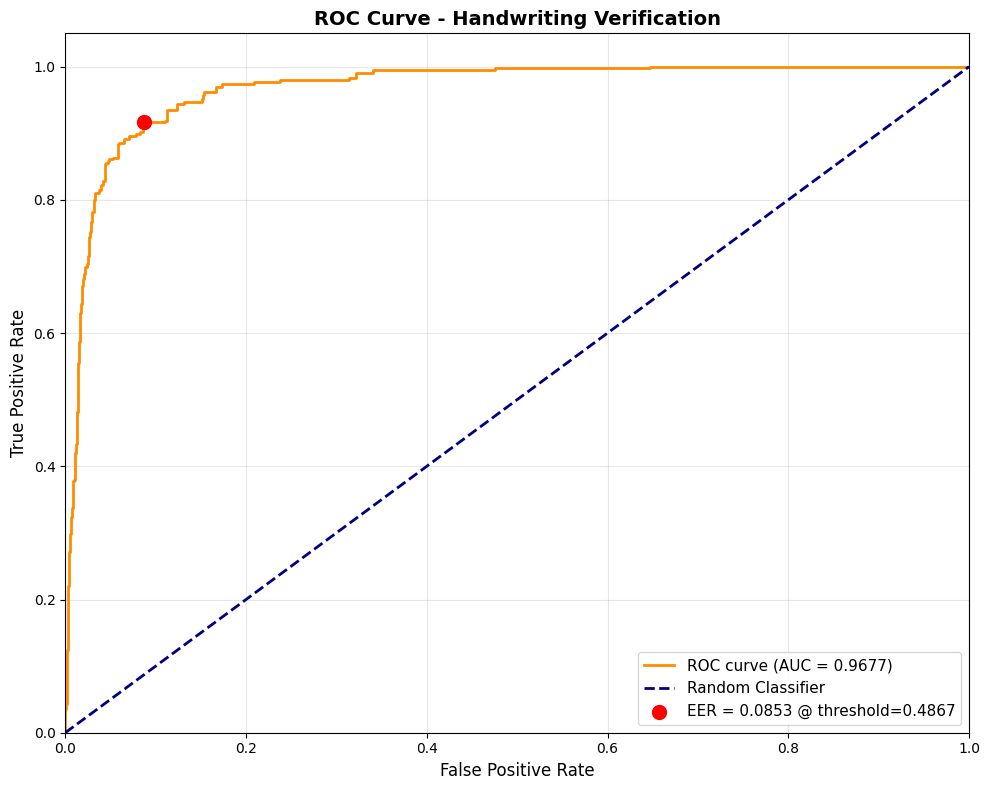


✓ ROC curve saved to results/roc_curve.png


In [36]:
from sklearn.metrics import roc_curve, auc

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(test_labels, test_scores)
roc_auc = auc(fpr, tpr)

# Calculate EER point
fnr = 1 - tpr
eer_idx = np.nanargmin(np.abs(fpr - fnr))
eer = (fpr[eer_idx] + fnr[eer_idx]) / 2

# Plot
plt.figure(figsize=(10, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Classifier')
plt.scatter(fpr[eer_idx], tpr[eer_idx], color='red', s=100, zorder=5, 
            label=f'EER = {eer:.4f} @ threshold={thresholds[eer_idx]:.4f}')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate', fontsize=12)
plt.title('ROC Curve - Handwriting Verification', fontsize=14, fontweight='bold')
plt.legend(loc="lower right", fontsize=11)
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('results/roc_curve.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"\n✓ ROC curve saved to results/roc_curve.png")

## **10. Training History Visualization**

These plots show how the model learned over time:

1. **Loss curves**: Should decrease and converge (if diverging → learning rate too high)
2. **Accuracy curves**: Should increase and plateau
3. **Gap between train and val**: Large gap → overfitting (need more regularization)

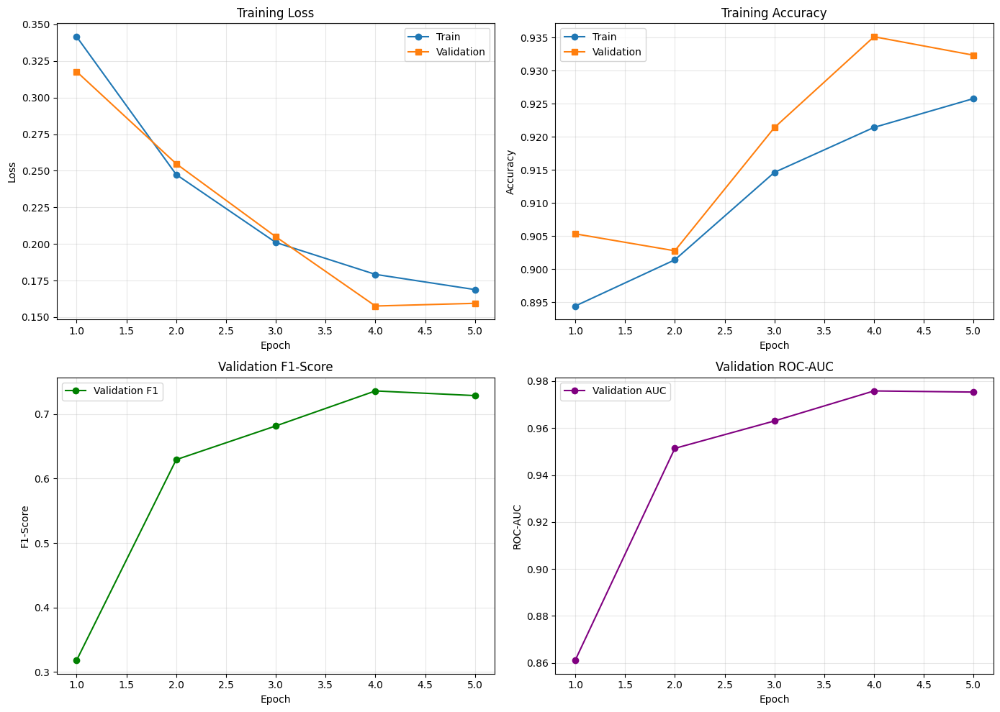


✓ Training history saved to results/training_history.png


In [38]:
# Load training history
history_df = pd.read_csv('results/MobileNet_history.csv')

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Loss
axes[0, 0].plot(history_df['epoch'], history_df['train_loss'], label='Train', marker='o')
axes[0, 0].plot(history_df['epoch'], history_df['val_loss'], label='Validation', marker='s')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Loss')
axes[0, 0].set_title('Training Loss')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# Accuracy
axes[0, 1].plot(history_df['epoch'], history_df['train_acc'], label='Train', marker='o')
axes[0, 1].plot(history_df['epoch'], history_df['val_acc'], label='Validation', marker='s')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Accuracy')
axes[0, 1].set_title('Training Accuracy')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# F1-Score
axes[1, 0].plot(history_df['epoch'], history_df['val_f1'], label='Validation F1', 
                marker='o', color='green')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('F1-Score')
axes[1, 0].set_title('Validation F1-Score')
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

# ROC-AUC
axes[1, 1].plot(history_df['epoch'], history_df['val_roc_auc'], label='Validation AUC', 
                marker='o', color='purple')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('ROC-AUC')
axes[1, 1].set_title('Validation ROC-AUC')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('results/training_history.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"\n✓ Training history saved to results/training_history.png")

## **11. Qualitative Evaluation - Visual Inspection**

### **Purpose**
Numbers don't tell the whole story. We need to visually inspect predictions to understand:
- What types of pairs does the model struggle with?
- Are failures due to similar writing styles or preprocessing artifacts?
- Does the model rely on spurious correlations (e.g., paper texture)?

### **What to Look For**
- ✅ **Correct predictions**: Model successfully distinguishes/matches styles
- ❌ **False positives**: Different writers misclassified as same (security risk)
- ❌ **False negatives**: Same writer misclassified as different (usability issue)

Generating sample predictions...



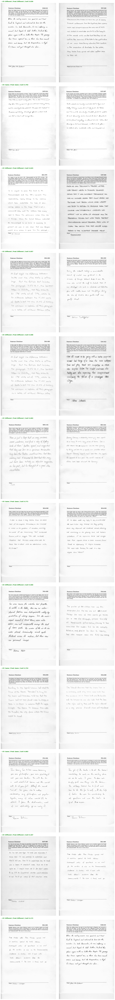


📊 Sample Accuracy: 12/12 = 100.0%
✓ Qualitative results saved to results/predictions_qualitative.png


In [39]:
from PIL import Image

def get_original_image(processed_path, original_root='/kaggle/input/iam-handwritten-forms-dataset/data'):
    """Map processed image back to original"""
    parts = processed_path.split(os.sep)
    writer_id = parts[-2]
    img_name = parts[-1]
    original_path = os.path.join(original_root, writer_id, img_name)
    return original_path

# Sample predictions from test set
print("Generating sample predictions...\n")

test_samples = []
num_samples = 12

for _ in range(num_samples):
    is_positive = random.random() < 0.3  # 30% positive for visualization variety
    
    if is_positive:
        writer_id = random.choice(test_dataset.writer_ids)
        img1_path, img2_path = random.sample(test_dataset.writer_images[writer_id], 2)
        label = 1.0
    else:
        writer1, writer2 = random.sample(test_dataset.writer_ids, 2)
        img1_path = random.choice(test_dataset.writer_images[writer1])
        img2_path = random.choice(test_dataset.writer_images[writer2])
        label = 0.0
    
    test_samples.append((img1_path, img2_path, label))

# Run inference
inference_transform = transforms.Compose([
    transforms.Resize((TARGET_SIZE, TARGET_SIZE)),
    transforms.ToTensor()
])

predictions = []
model.eval()

with torch.no_grad():
    for img1_path, img2_path, label in test_samples:
        img1 = inference_transform(Image.open(img1_path).convert("L")).unsqueeze(0).to(device)
        img2 = inference_transform(Image.open(img2_path).convert("L")).unsqueeze(0).to(device)
        
        score = model(img1, img2).item()
        pred = "Same" if score > 0.5 else "Different"
        gt = "Same" if label == 1.0 else "Different"
        
        predictions.append({
            'img1_proc': img1_path,
            'img2_proc': img2_path,
            'ground_truth': gt,
            'prediction': pred,
            'confidence': score
        })

# Visualize predictions
ORIGINAL_ROOT = '/kaggle/input/iam-handwritten-forms-dataset/data'
PLOT_SIZE = (619, 885)  # Scaled down from (2479, 3542)

n_pairs = len(predictions)
fig_width = (PLOT_SIZE[0] * 2) / 96
fig_height = (PLOT_SIZE[1] * n_pairs) / 96

fig, axes = plt.subplots(n_pairs, 2, figsize=(fig_width, fig_height))
fig.patch.set_facecolor('white')

for i, pred_info in enumerate(predictions):
    # Load original images
    try:
        img1_path = get_original_image(pred_info['img1_proc'], ORIGINAL_ROOT)
        img2_path = get_original_image(pred_info['img2_proc'], ORIGINAL_ROOT)
        
        img1 = Image.open(img1_path).convert('L')
        img2 = Image.open(img2_path).convert('L')
    except:
        # Fallback to processed images if originals not found
        img1 = Image.open(pred_info['img1_proc']).convert('L')
        img2 = Image.open(pred_info['img2_proc']).convert('L')
    
    # Resize
    img1_resized = img1.resize(PLOT_SIZE, Image.LANCZOS)
    img2_resized = img2.resize(PLOT_SIZE, Image.LANCZOS)
    
    # Plot
    axes[i, 0].imshow(img1_resized, cmap='gray', interpolation='bilinear')
    axes[i, 0].axis('off')
    
    axes[i, 1].imshow(img2_resized, cmap='gray', interpolation='bilinear')
    axes[i, 1].axis('off')
    
    # Title
    is_correct = pred_info['ground_truth'] == pred_info['prediction']
    color = 'green' if is_correct else 'red'
    symbol = '✓' if is_correct else '✗'
    
    title = (f"{symbol} GT: {pred_info['ground_truth']} | "
             f"Pred: {pred_info['prediction']} | "
             f"Conf: {pred_info['confidence']:.3f}")
    
    axes[i, 0].set_title(title, fontsize=10, color=color, weight='bold', pad=8, loc='left')

plt.subplots_adjust(hspace=0.05, wspace=0.02, left=0.01, right=0.99, top=0.99, bottom=0.01)
plt.savefig('results/predictions_qualitative.png', dpi=150, bbox_inches='tight', pad_inches=0.1)
plt.show()

# Statistics
correct = sum(1 for p in predictions if p['ground_truth'] == p['prediction'])
print(f"\n📊 Sample Accuracy: {correct}/{n_pairs} = {correct/n_pairs*100:.1f}%")
print(f"✓ Qualitative results saved to results/predictions_qualitative.png")

## Definizione delle reti

Di seguito, definiamo diverse **reti siamese** basate su architetture di feature extraction note, adattate per immagini **in scala di grigi** (1 canale) e per il task di **verifica di similarità** tra immagini manoscritte.  
Ogni rete segue la stessa logica di base:
- due immagini vengono passate attraverso uno stesso encoder;
- si ottengono due vettori di feature$ f_1$ e$ f_2$;
- i vettori vengono concatenati e passati a un classificatore fully connected che produce una probabilità$ \hat{y} \in [0,1]$.

Di seguito le principali architetture usate e le motivazioni delle loro scelte.

### 🔗 Concatenazione dei feature vector e fusione ("fused comparator")

Ogni rete **siamese** riceve in ingresso due immagini, $x_1$ e $x_2$, e tramite un encoder convoluzionale estrae due vettori di feature:
$$
f_1 = \text{encoder}(x_1), \quad f_2 = \text{encoder}(x_2)
$$
dove $f_1, f_2 \in \mathbb{R}^d$ sono rappresentazioni compatte delle immagini.

#### Approccio classico (metrica fissa)

Nei modelli siamese originari, si calcola una **distanza fissa** tra i due vettori, ad esempio:
$$
D_{\text{L1}} = \|f_1 - f_2\|_1, \quad
D_{\text{L2}} = \|f_1 - f_2\|_2, \quad
D_{\text{cos}} = 1 - \frac{f_1 \cdot f_2}{\|f_1\|\|f_2\|}
$$

Questa distanza viene poi utilizzata all’interno di una *contrastive loss* o *triplet loss* che forza le coppie simili ad avere distanza piccola e quelle diverse ad avere distanza grande.  
Il modello apprende quindi uno **spazio metrico interpretabile**, dove la distanza geometrica corrisponde alla somiglianza semantica.

### Approccio moderno (concatenazione e metrica appresa)

Nel codice attuale, invece, i vettori $f_1$ e $f_2$ vengono **concatenati**:
$$
z = [f_1, f_2] \in \mathbb{R}^{2d}
$$
e passati a un piccolo *Multi-Layer Perceptron* (MLP) che produce la probabilità finale:
$$
\hat{y} = \sigma(W_2 \, \text{ReLU}(W_1 z + b_1) + b_2)
$$

In questo modo, la rete **non utilizza una distanza predefinita**, ma lascia che la funzione completamente connessa impari **una metrica non lineare**:
$$
S(f_1, f_2) = \text{MLP}([f_1, f_2])
$$
che stima la probabilità che le due immagini appartengano alla stessa classe.

Questo approccio è più flessibile perché permette alla rete di:
- pesare diversamente ogni dimensione del vettore di feature;
- apprendere interazioni complesse tra caratteristiche;
- adattarsi a dati rumorosi o non metrici (come la scrittura a mano).

### 1. **SiameseResNet18** e **SiameseResNet34**

- **Base model:** ResNet18 / ResNet34 (ResNet = Residual Network).  
- **Motivazione:** Reti classiche e robuste, con blocchi *residuali* che aiutano a propagare il gradiente anche in reti profonde.  
- **Modifiche apportate:**
  - Il layer iniziale `conv1` è stato adattato per accettare immagini **grayscale** (1 canale invece di 3).
  - L’ultimo layer di classificazione è stato rimosso, mantenendo solo la parte di estrazione delle feature (`encoder`).
  - Le feature di ciascuna immagine (512 dimensioni) vengono concatenate (1024 totali) e passate al classificatore:
    $$
    \text{FC}: 1024 \rightarrow 256 \rightarrow 1
    $$
- **Caratteristiche:** buoni risultati su dataset medi, architettura bilanciata tra efficienza e capacità rappresentativa.


In [20]:
from torchvision.models import resnet18, ResNet18_Weights, resnet34, ResNet34_Weights

class SiameseResNet18(nn.Module):
    def __init__(self):
        super().__init__()
        # ResNet18 pre-addestrata (modificata per grayscale)
        resnet = resnet18(weights=ResNet18_Weights.DEFAULT)
        resnet.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
        # Rimuovi l'ultimo layer
        self.encoder = nn.Sequential(*list(resnet.children())[:-1])
        
        # Classificatore
        self.fc = nn.Sequential(
            # 1️⃣ Prima proiezione
            nn.Linear(1024, PROJECTION_LAYER),
            nn.BatchNorm1d(PROJECTION_LAYER),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),
        
            # 2️⃣ Primo livello intermedio
            nn.Linear(PROJECTION_LAYER, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),
        
            # 3️⃣ Secondo livello intermedio
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),
        
            # 4️⃣ Output finale binario
            nn.Linear(256, 1),
            nn.Sigmoid()
        )
    
    def forward_one(self, x):
        x = self.encoder(x)
        return x.view(x.size(0), -1)
    
    def forward(self, img1, img2):
        feat1 = self.forward_one(img1)
        feat2 = self.forward_one(img2)
        combined = torch.cat([feat1, feat2], dim=1)
        return self.fc(combined)

class SiameseResNet34(nn.Module):
    def __init__(self):
        super().__init__()
        resnet = resnet34(weights=ResNet34_Weights.DEFAULT)
        resnet.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.encoder = nn.Sequential(*list(resnet.children())[:-1])
        
        # Classificatore
        self.fc = nn.Sequential(
            # 1️⃣ Prima proiezione
            nn.Linear(1024, PROJECTION_LAYER),
            nn.BatchNorm1d(PROJECTION_LAYER),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),
        
            # 2️⃣ Primo livello intermedio
            nn.Linear(PROJECTION_LAYER, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),
        
            # 3️⃣ Secondo livello intermedio
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),
        
            # 4️⃣ Output finale binario
            nn.Linear(256, 1),
            nn.Sigmoid()
        )
    
    def forward_one(self, x):
        x = self.encoder(x)
        return x.view(x.size(0), -1)
    
    def forward(self, img1, img2):
        feat1 = self.forward_one(img1)
        feat2 = self.forward_one(img2)
        combined = torch.cat([feat1, feat2], dim=1)
        return self.fc(combined)

from torchvision.models import resnet50, ResNet50_Weights

class SiameseResNet50(nn.Module):
    def __init__(self):
        super().__init__()
        resnet = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        resnet.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.encoder = nn.Sequential(*list(resnet.children())[:-1])
        
        self.fc = nn.Sequential(
            # 1️⃣ Prima proiezione (ResNet50 output: 2048*2 = 4096)
            nn.Linear(4096, PROJECTION_LAYER),
            nn.BatchNorm1d(PROJECTION_LAYER),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),
        
            # 2️⃣ Primo livello intermedio
            nn.Linear(PROJECTION_LAYER, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),
        
            # 3️⃣ Secondo livello intermedio
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),
        
            # 4️⃣ Output finale binario
            nn.Linear(256, 1),
            nn.Sigmoid()
        )
    
    def forward_one(self, x):
        x = self.encoder(x)
        return x.view(x.size(0), -1)
    
    def forward(self, img1, img2, return_embeddings=False):
        feat1 = self.forward_one(img1)
        feat2 = self.forward_one(img2)
        
        if return_embeddings:
            # Per contrastive loss: normalizza embeddings
            feat1 = F.normalize(feat1, p=2, dim=1)
            feat2 = F.normalize(feat2, p=2, dim=1)
            return feat1, feat2
        
        combined = torch.cat([feat1, feat2], dim=1)
        return self.fc(combined)

### 2. **SiameseEfficientNet** (B0) e **SiameseEfficientNetV2**

- **Base model:** EfficientNet-B0 e EfficientNetV2-S.  
- **Motivazione:** Modelli **più moderni e ottimizzati** per rapporto accuratezza/parametri, con scaling bilanciato di profondità, larghezza e risoluzione.  
- **Modifiche:**
  - Il primo layer convoluzionale è adattato per immagini monocanale.
  - Viene aggiunto un layer di *Adaptive Average Pooling* per ottenere una rappresentazione compatta (1280 dimensioni per immagine).
  - Le due feature vengono concatenate in un vettore da 2560 dimensioni:
    $$
    \text{FC}: 2560 \rightarrow 256 \rightarrow 1
    $$
- **EfficientNetV2** differisce dal B0 per un encoder più profondo e ottimizzato con blocchi *fused-MBConv*, che accelerano il training e migliorano la stabilità.  
  Inoltre, il layer iniziale è ridefinito come:
  $$
  \text{Conv2d}(1, 24, \text{kernel}=3, \text{stride}=2, \text{padding}=1)
  $$
  che riduce subito la dimensione spaziale, conservando informazioni locali utili.


In [21]:
from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights

class SiameseEfficientNet(nn.Module):
    def __init__(self):
        super().__init__()
        effnet = efficientnet_b0(weights=EfficientNet_B0_Weights.DEFAULT)
        effnet.features[0][0] = nn.Conv2d(1, 32, kernel_size=3, stride=2, padding=1, bias=False)
        self.encoder = nn.Sequential(effnet.features, nn.AdaptiveAvgPool2d(1))
        
        self.fc = nn.Sequential(
            nn.Linear(2560, PROJECTION_LAYER),  # 1280*2
            nn.BatchNorm1d(PROJECTION_LAYER),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),
        
            # 2️⃣ Primo livello intermedio
            nn.Linear(PROJECTION_LAYER, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),
        
            # 3️⃣ Secondo livello intermedio
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),
        
            # 4️⃣ Output finale binario
            nn.Linear(256, 1),
            nn.Sigmoid()
        )
    
    def forward_one(self, x):
        x = self.encoder(x)
        return x.view(x.size(0), -1)
    
    def forward(self, img1, img2):
        feat1 = self.forward_one(img1)
        feat2 = self.forward_one(img2)
        combined = torch.cat([feat1, feat2], dim=1)
        return self.fc(combined)

from torchvision.models import efficientnet_v2_s, EfficientNet_V2_S_Weights

class SiameseEfficientNetV2(nn.Module):
    def __init__(self, in_channels=1):
        super().__init__()
        
        # ✅ Backbone EfficientNetV2-S ufficiale
        backbone = efficientnet_v2_s(weights=EfficientNet_V2_S_Weights.DEFAULT)
        
        # Adatta il primo layer per immagini in scala di grigi
        backbone.features[0][0] = nn.Conv2d(
            in_channels, 24, kernel_size=3, stride=2, padding=1, bias=False
        )
        
        # Encoder: tutte le feature + global pooling
        self.encoder = nn.Sequential(
            backbone.features,
            nn.AdaptiveAvgPool2d(1)
        )
        
        # EfficientNetV2-S → feature vector = 1280 dim
        feat_dim = 1280
        
        # Classificatore siamese
        self.fc = nn.Sequential(
            nn.Linear(feat_dim * 2, PROJECTION_LAYER),
            nn.BatchNorm1d(PROJECTION_LAYER),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),

            nn.Linear(PROJECTION_LAYER, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),

            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),

            nn.Linear(256, 1),
            nn.Sigmoid()
        )

    def forward_one(self, x):
        x = self.encoder(x)
        return x.view(x.size(0), -1)

    def forward(self, img1, img2):
        feat1 = self.forward_one(img1)
        feat2 = self.forward_one(img2)
        combined = torch.cat([feat1, feat2], dim=1)
        return self.fc(combined)

class SiameseEfficientNetB1(nn.Module):
    def __init__(self):
        super().__init__()
        from torchvision.models import efficientnet_b1, EfficientNet_B1_Weights
        
        efficientnet = efficientnet_b1(weights=EfficientNet_B1_Weights.DEFAULT)
        efficientnet.features[0][0] = nn.Conv2d(1, 32, kernel_size=3, stride=2, padding=1, bias=False)
        self.encoder = nn.Sequential(efficientnet.features, nn.AdaptiveAvgPool2d(1))
        
        self.fc = nn.Sequential(
            # 1️⃣ Prima proiezione (EfficientNet-B1 output: 1280*2 = 2560)
            nn.Linear(2560, PROJECTION_LAYER),
            nn.BatchNorm1d(PROJECTION_LAYER),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),
        
            # 2️⃣ Primo livello intermedio
            nn.Linear(PROJECTION_LAYER, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),
        
            # 3️⃣ Secondo livello intermedio
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),
        
            # 4️⃣ Output finale binario
            nn.Linear(256, 1),
            nn.Sigmoid()
        )
    
    def forward_one(self, x):
        x = self.encoder(x)
        return x.view(x.size(0), -1)
    
    def forward(self, img1, img2, return_embeddings=False):
        feat1 = self.forward_one(img1)
        feat2 = self.forward_one(img2)
        
        if return_embeddings:
            feat1 = F.normalize(feat1, p=2, dim=1)
            feat2 = F.normalize(feat2, p=2, dim=1)
            return feat1, feat2
        
        combined = torch.cat([feat1, feat2], dim=1)
        return self.fc(combined)

### 3. **SiameseMobileNet**

- **Base model:** MobileNetV3-Small.  
- **Motivazione:** Architettura **leggera ed efficiente**, ideale per sperimentazioni rapide o dispositivi a bassa potenza.  
- **Modifiche:**
  - Adattamento del primo layer per 1 canale.
  - Inserimento di *AdaptiveAvgPool2d(1)* per comprimere le feature.
  - Concatenazione delle rappresentazioni (576 × 2 = 1152 dimensioni).
  - Classificatore:
    $$
    \text{FC}: 1152 \rightarrow 256 \rightarrow 1
    $$
- **Caratteristiche:** meno potente delle reti più grandi, ma con ottimo compromesso tra velocità e accuratezza.

In [22]:
from torchvision.models import mobilenet_v3_small, MobileNet_V3_Small_Weights

class SiameseMobileNet(nn.Module):
    def __init__(self):
        super().__init__()
        mobilenet = mobilenet_v3_small(weights=MobileNet_V3_Small_Weights.DEFAULT)
        mobilenet.features[0][0] = nn.Conv2d(1, 16, kernel_size=3, stride=2, padding=1, bias=False)
        self.encoder = nn.Sequential(mobilenet.features, nn.AdaptiveAvgPool2d(1))
        
        self.fc = nn.Sequential(
            nn.Linear(1152, PROJECTION_LAYER),
            nn.BatchNorm1d(PROJECTION_LAYER),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),
        
            # 2️⃣ Primo livello intermedio
            nn.Linear(PROJECTION_LAYER, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),
        
            # 3️⃣ Secondo livello intermedio
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),
        
            # 4️⃣ Output finale binario
            nn.Linear(256, 1),
            nn.Sigmoid()
        )
    
    def forward_one(self, x):
        x = self.encoder(x)
        return x.view(x.size(0), -1)
    
    def forward(self, img1, img2):
        feat1 = self.forward_one(img1)
        feat2 = self.forward_one(img2)
        combined = torch.cat([feat1, feat2], dim=1)
        return self.fc(combined)

class SiameseMobileNetV3Large(nn.Module):
    def __init__(self):
        super().__init__()
        from torchvision.models import mobilenet_v3_large, MobileNet_V3_Large_Weights
        
        mobilenet = mobilenet_v3_large(weights=MobileNet_V3_Large_Weights.DEFAULT)
        mobilenet.features[0][0] = nn.Conv2d(1, 16, kernel_size=3, stride=2, padding=1, bias=False)
        self.encoder = nn.Sequential(mobilenet.features, nn.AdaptiveAvgPool2d(1))
        
        self.fc = nn.Sequential(
            # 1️⃣ Prima proiezione (MobileNetV3-Large output: 960*2 = 1920)
            nn.Linear(1920, PROJECTION_LAYER),
            nn.BatchNorm1d(PROJECTION_LAYER),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),
        
            # 2️⃣ Primo livello intermedio
            nn.Linear(PROJECTION_LAYER, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),
        
            # 3️⃣ Secondo livello intermedio
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),
        
            # 4️⃣ Output finale binario
            nn.Linear(256, 1),
            nn.Sigmoid()
        )
    
    def forward_one(self, x):
        x = self.encoder(x)
        return x.view(x.size(0), -1)
    
    def forward(self, img1, img2, return_embeddings=False):
        feat1 = self.forward_one(img1)
        feat2 = self.forward_one(img2)
        
        if return_embeddings:
            feat1 = F.normalize(feat1, p=2, dim=1)
            feat2 = F.normalize(feat2, p=2, dim=1)
            return feat1, feat2
        
        combined = torch.cat([feat1, feat2], dim=1)
        return self.fc(combined)

### 4. **SiameseDenseNet**

- **Base model:** DenseNet121.  
- **Motivazione:** Le DenseNet concatenano direttamente le feature da blocchi precedenti, favorendo la **riusabilità delle rappresentazioni** e un gradiente più stabile.  
- **Modifiche:**
  - Il layer iniziale `conv0` accetta 1 canale.
  - Le feature finali (1024 dimensioni per immagine) vengono ridotte tramite *AdaptiveAvgPool2d* e concatenate (2048 totali).  
  - Classificatore:
    $$
    \text{FC}: 2048 \rightarrow 256 \rightarrow 1
    $$
- **Caratteristiche:** grande capacità di catturare pattern locali e globali della scrittura.

In [23]:
from torchvision.models import densenet121, DenseNet121_Weights

class SiameseDenseNet(nn.Module):
    def __init__(self):
        super().__init__()
        densenet = densenet121(weights=DenseNet121_Weights.DEFAULT)
        densenet.features.conv0 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.encoder = nn.Sequential(densenet.features, nn.AdaptiveAvgPool2d(1))
        
        self.fc = nn.Sequential(
            nn.Linear(2048, PROJECTION_LAYER),
            nn.BatchNorm1d(PROJECTION_LAYER),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),
        
            # 2️⃣ Primo livello intermedio
            nn.Linear(PROJECTION_LAYER, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),
        
            # 3️⃣ Secondo livello intermedio
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),
        
            # 4️⃣ Output finale binario
            nn.Linear(256, 1),
            nn.Sigmoid()
        )
    
    def forward_one(self, x):
        x = self.encoder(x)
        return x.view(x.size(0), -1)
    
    def forward(self, img1, img2):
        feat1 = self.forward_one(img1)
        feat2 = self.forward_one(img2)
        combined = torch.cat([feat1, feat2], dim=1)
        return self.fc(combined)

In [24]:
class SiameseRegNet(nn.Module):
    def __init__(self):
        super().__init__()
        from torchvision.models import regnet_y_400mf, RegNet_Y_400MF_Weights
        
        regnet = regnet_y_400mf(weights=RegNet_Y_400MF_Weights.DEFAULT)
        regnet.stem[0] = nn.Conv2d(1, 32, kernel_size=3, stride=2, padding=1, bias=False)
        self.encoder = nn.Sequential(*list(regnet.children())[:-1], nn.AdaptiveAvgPool2d(1))
        
        self.fc = nn.Sequential(
            # 1️⃣ Prima proiezione (RegNet-Y-400MF output: 440*2 = 880)
            nn.Linear(880, PROJECTION_LAYER),
            nn.BatchNorm1d(PROJECTION_LAYER),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),
        
            # 2️⃣ Primo livello intermedio
            nn.Linear(PROJECTION_LAYER, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),
        
            # 3️⃣ Secondo livello intermedio
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),
        
            # 4️⃣ Output finale binario
            nn.Linear(256, 1),
            nn.Sigmoid()
        )
    
    def forward_one(self, x):
        x = self.encoder(x)
        return x.view(x.size(0), -1)
    
    def forward(self, img1, img2, return_embeddings=False):
        feat1 = self.forward_one(img1)
        feat2 = self.forward_one(img2)
        
        if return_embeddings:
            feat1 = F.normalize(feat1, p=2, dim=1)
            feat2 = F.normalize(feat2, p=2, dim=1)
            return feat1, feat2
        
        combined = torch.cat([feat1, feat2], dim=1)
        return self.fc(combined)

### Training phase

Questo script allena una serie di reti **siamese** (ResNet, EfficientNet, DenseNet, MobileNet, ConvNeXt, ecc.) per il compito di **verificare se due immagini di testo manoscritto appartengono alla stessa persona**.

#### Struttura generale

La funzione `train_model` gestisce l’intero ciclo di addestramento, validazione, salvataggio e monitoraggio delle prestazioni del modello.

1. **Inizializzazione**

    Ogni modello viene spostato sul dispositivo disponibile (CPU o GPU) e viene definita una funzione di perdita binaria:
           $$
           \mathcal{L} = -[y \log(\hat{y}) + (1 - y)\log(1 - \hat{y})]
           $$
           dove $\hat{y}$ è la probabilità stimata che le due immagini appartengano alla stessa persona.
    
       
    Il **learning rate** ($\eta$) viene scelto in modo **adattivo** in base alla complessità del modello (numero di parametri totali $N_{\text{param}}$):
    
    $$
    \eta =
    \begin{cases}
    3 \times 10^{-5}, & \text{se } N_{\text{param}} > 15 \times 10^6 \\
    5 \times 10^{-5}, & \text{altrimenti}
    \end{cases}
    $$
    
    Come ottimizzatore si utilizza **AdamW**, una versione migliorata di Adam che separa (decouples) il termine di regolarizzazione dal gradiente.  
    Questo approccio rende il *weight decay* un’effettiva penalizzazione $L_2$ sulla magnitudine dei pesi, migliorando la stabilità e la generalizzazione del modello.
    
    L’aggiornamento dei parametri segue la forma:
    
    $$
    \theta_{t+1} = \theta_t - \eta \frac{\hat{m}_t}{\sqrt{\hat{v}_t} + \epsilon} - \eta \, \lambda \, \theta_t
    $$
    
    dove:
    - $\hat{m}_t$ e $\hat{v}_t$ sono le stime corrette del primo e secondo momento del gradiente,
    - $\epsilon$ è un termine di stabilità numerica,
    - $\lambda$ è il coefficiente di weight decay (qui $10^{-4}$).
    
    Infine, viene adottato un **scheduler di tipo *ReduceLROnPlateau*** che riduce automaticamente il learning rate quando la *validation loss* non migliora più, con:
    - fattore di riduzione = **0.5**
    - pazienza = **2** epoche  
    
    Questo consente un adattamento dinamico della velocità di apprendimento, aiutando il modello a convergere in modo più stabile nelle fasi finali del training.

2. **Fase di training**

   Per ogni epoca, il modello entra in modalità di addestramento e vengono eseguiti i seguenti passi per ciascun batch:
   - Le immagini $(x_1, x_2)$ e le etichette $y \in \{0,1\}$ vengono caricate e passate nel modello.
   - Il modello produce un’uscita $\hat{y} = f_\theta(x_1, x_2) \in [0,1]$, ovvero la probabilità che le due immagini appartengano alla stessa classe.
   - Si calcola la perdita $\mathcal{L}$ e si aggiorna il vettore dei pesi $\theta$ tramite **backpropagation**:
     $$
     \theta \leftarrow \theta - \eta \nabla_\theta \mathcal{L}
     $$
   - Si registrano la *loss* e l’accuratezza medie sull’intero set di training.



3. **Fase di validazione**

   Terminato il training per un’epoca, il modello passa in modalità *evaluation* (nessun aggiornamento dei pesi) e viene valutato sul set di test.  
   Si calcolano:
   - la *loss media di validazione*, indicativa della capacità di generalizzazione;
   - l’**accuratezza di test**, data da:
     $$
     \text{Acc} = \frac{1}{N} \sum_{i=1}^{N} \mathbb{1}\big[\hat{y}_i > 0.5 \Leftrightarrow y_i = 1\big]
     $$



4. **Scheduler ed early stopping**

   Dopo ogni epoca, se la *test loss* non migliora per un numero di epoche pari a “patience” (default = 5), il training viene interrotto automaticamente.  
   Il modello che ottiene la *miglior test loss* viene salvato come:
   $$
   \text{model\_name\_best.pth}
   $$



5. **Salvataggio dei risultati**

   Alla fine del training, vengono salvati:
   - i pesi finali del modello;
   - un file `.csv` con l’andamento di `train_loss`, `train_acc`, `test_loss` e `test_acc` per ogni epoca.



6. **Training multiplo**

   Tutti i modelli presenti nel dizionario `models_dict` vengono addestrati in sequenza sullo stesso dataset.  
   Al termine, viene stampato un riepilogo con la *migliore test loss* ottenuta da ciascuna architettura.

In sintesi, il processo implementa un ciclo di addestramento completo, con:
- ottimizzazione adattiva,
- scheduler dinamico,
- early stopping,
- e salvataggio automatico del miglior modello.

In [ ]:
def train_model(model, model_name, train_loader, test_loader, epochs=50):
    print(f"\n{'='*60}")
    print(f"Training {model_name}")
    print(f"{'='*60}\n")

    # Creating results dir
    results_folder = "results"
    os.makedirs(results_folder, exist_ok=True)
    
    model = model.to(device)
    criterion = nn.BCELoss()
    
    # Learning rate adattivo
    num_params = sum(p.numel() for p in model.parameters())
    lr = 3e-5 if num_params > 15e6 else 5e-5
    
    # Ottimizzatore: AdamW (decoupled weight decay)
    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=lr,
        weight_decay=1e-4,  # regolarizzazione più efficace che in Adam
        betas=(0.9, 0.999),  # impostazioni standard e consigliate
        eps=1e-8
    )
    
    # Scheduler per ridurre il LR se la loss non migliora
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode='min',
        factor=0.5,
        patience=2,
        verbose=True
    )
    
    history = {
        'epoch': [],
        'train_loss': [],
        'train_acc': [],
        'test_loss': [],
        'test_acc': []
    }
    
    best_test_loss = float('inf')
    patience_counter = 0
    patience = 5
    
    for epoch in range(epochs):
        # Train
        model.train()
        train_loss, train_preds, train_labels = 0, [], []
        
        for img1, img2, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}"):
            img1, img2, labels = img1.to(device), img2.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs = model(img1, img2).squeeze()
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item()
            train_preds.extend((outputs > 0.5).cpu().numpy())
            train_labels.extend(labels.cpu().numpy())
        
        train_loss /= len(train_loader)
        train_acc = accuracy_score(train_labels, train_preds)
        
        # Test
        model.eval()
        test_loss, test_preds, test_labels = 0, [], []
        
        with torch.no_grad():
            for img1, img2, labels in tqdm(test_loader, desc="Validating", leave=False):
                img1, img2, labels = img1.to(device), img2.to(device), labels.to(device)
                outputs = model(img1, img2).squeeze()
                test_loss += criterion(outputs, labels).item()
                test_preds.extend((outputs > 0.5).cpu().numpy())
                test_labels.extend(labels.cpu().numpy())
        
        test_loss /= len(test_loader)
        test_acc = accuracy_score(test_labels, test_preds)
        
        scheduler.step(test_loss)
        
        # Salva metriche
        history['epoch'].append(epoch + 1)
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['test_loss'].append(test_loss)
        history['test_acc'].append(test_acc)
        
        print(f"Epoch {epoch+1}: Train Loss={train_loss:.4f} Acc={train_acc:.4f} | "
              f"Test Loss={test_loss:.4f} Acc={test_acc:.4f}")
        
        # Early stopping
        if test_loss < best_test_loss:
            best_test_loss = test_loss
            patience_counter = 0
            torch.save(model.state_dict(), f'{model_name}_best.pth')
            print(f"✓ Saved best model (test_loss: {test_loss:.4f})")
        else:
            patience_counter += 1
            print(f"Patience: {patience_counter}/{patience}")
            if patience_counter >= patience:
                print("Early stopping triggered")
                break
    
    # Salva finale
    torch.save(model.state_dict(), f'results/{model_name}_final.pth')
    pd.DataFrame(history).to_csv(f'results/{model_name}_history.csv', index=False)
    print(f"\n✓ {model_name} training completed! Best test loss: {best_test_loss:.4f}\n")
    model.cpu()
    
    return history, best_test_loss

# Dizionario modelli
models_dict = {
    'resnet18': SiameseResNet18,
    'resnet34': SiameseResNet34,
    'resnet50': SiameseResNet50,
    'efficientnet_b0': SiameseEfficientNet,
    'efficientnet_b1': SiameseEfficientNetB1,
    'efficientnetv2': SiameseEfficientNetV2,
    'mobilenet': SiameseMobileNet,
    'mobilenet_v3_large': SiameseMobileNetV3Large,
    'densenet': SiameseDenseNet,
    'regnet_y_400mf': SiameseRegNet,
}

# Train tutti i modelli
results = {}
for model_name, ModelClass in models_dict.items():
    # Crea il modello solo quando serve
    model = ModelClass()  # ← Istanzia QUI
    
    history, best_loss = train_model(model, model_name, train_loader, test_loader, epochs=EPOCHS)
    results[model_name] = {'history': history, 'best_loss': best_loss}
    
    # 🆕 PULIZIA MEMORIA
    del model
    torch.cuda.empty_cache()
    gc.collect()
    
    print(f"✓ GPU memory cleared after {model_name}\n")

# Riepilogo finale
print(f"\n{'='*60}")
print("FINAL RESULTS")
print(f"{'='*60}")
for model_name, result in results.items():
    print(f"{model_name:15s}: Best Test Loss = {result['best_loss']:.4f}")

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 225MB/s]
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(



Training resnet18



Epoch 1/2: 100%|██████████| 1532/1532 [01:28<00:00, 17.30it/s]


Epoch 1: Train Loss=0.6861 Acc=0.5490 | Test Loss=0.4875 Acc=0.7918
✓ Saved best model (test_loss: 0.4875)


Epoch 2/2: 100%|██████████| 1532/1532 [01:28<00:00, 17.33it/s]


Epoch 2: Train Loss=0.4763 Acc=0.7803 | Test Loss=0.3488 Acc=0.8482
✓ Saved best model (test_loss: 0.3488)

✓ resnet18 training completed! Best test loss: 0.3488

✓ GPU memory cleared after resnet18



Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 234MB/s]
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(



Training resnet34



Epoch 1/2: 100%|██████████| 1532/1532 [02:23<00:00, 10.65it/s]


Epoch 1: Train Loss=0.7001 Acc=0.5264 | Test Loss=0.5884 Acc=0.6920
✓ Saved best model (test_loss: 0.5884)


Epoch 2/2: 100%|██████████| 1532/1532 [02:23<00:00, 10.65it/s]


Epoch 2: Train Loss=0.5677 Acc=0.7001 | Test Loss=0.4613 Acc=0.7863
✓ Saved best model (test_loss: 0.4613)

✓ resnet34 training completed! Best test loss: 0.4613

✓ GPU memory cleared after resnet34



Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 192MB/s]
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(



Training resnet50



Epoch 1/2: 100%|██████████| 1532/1532 [04:35<00:00,  5.56it/s]


Epoch 1: Train Loss=0.7052 Acc=0.5128 | Test Loss=0.6463 Acc=0.6582
✓ Saved best model (test_loss: 0.6463)


Epoch 2/2: 100%|██████████| 1532/1532 [04:35<00:00,  5.56it/s]


Epoch 2: Train Loss=0.5847 Acc=0.6856 | Test Loss=0.4204 Acc=0.8095
✓ Saved best model (test_loss: 0.4204)

✓ resnet50 training completed! Best test loss: 0.4204

✓ GPU memory cleared after resnet50



Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 165MB/s]
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(



Training efficientnet_b0



Epoch 1/2: 100%|██████████| 1532/1532 [03:08<00:00,  8.13it/s]


Epoch 1: Train Loss=0.6666 Acc=0.5780 | Test Loss=0.5191 Acc=0.7432
✓ Saved best model (test_loss: 0.5191)


Epoch 2/2: 100%|██████████| 1532/1532 [03:08<00:00,  8.14it/s]


Epoch 2: Train Loss=0.5101 Acc=0.7495 | Test Loss=0.3633 Acc=0.8407
✓ Saved best model (test_loss: 0.3633)

✓ efficientnet_b0 training completed! Best test loss: 0.3633



Downloading: "https://download.pytorch.org/models/efficientnet_b1-c27df63c.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b1-c27df63c.pth


✓ GPU memory cleared after efficientnet_b0



100%|██████████| 30.1M/30.1M [00:00<00:00, 114MB/s] 
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(



Training efficientnet_b1



Epoch 1/2: 100%|██████████| 1532/1532 [04:27<00:00,  5.73it/s]


Epoch 1: Train Loss=0.6738 Acc=0.5694 | Test Loss=0.5418 Acc=0.7330
✓ Saved best model (test_loss: 0.5418)


Epoch 2/2: 100%|██████████| 1532/1532 [04:28<00:00,  5.71it/s]


Epoch 2: Train Loss=0.5328 Acc=0.7328 | Test Loss=0.3796 Acc=0.8432
✓ Saved best model (test_loss: 0.3796)

✓ efficientnet_b1 training completed! Best test loss: 0.3796

✓ GPU memory cleared after efficientnet_b1



Downloading: "https://download.pytorch.org/models/efficientnet_v2_s-dd5fe13b.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_v2_s-dd5fe13b.pth
100%|██████████| 82.7M/82.7M [00:00<00:00, 210MB/s]
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(



Training efficientnetv2



Epoch 1/2: 100%|██████████| 1532/1532 [06:33<00:00,  3.89it/s]


Epoch 1: Train Loss=0.7070 Acc=0.5190 | Test Loss=0.6489 Acc=0.6309
✓ Saved best model (test_loss: 0.6489)


Epoch 2/2: 100%|██████████| 1532/1532 [06:35<00:00,  3.87it/s]


Epoch 2: Train Loss=0.5806 Acc=0.6903 | Test Loss=0.4415 Acc=0.7959
✓ Saved best model (test_loss: 0.4415)

✓ efficientnetv2 training completed! Best test loss: 0.4415

✓ GPU memory cleared after efficientnetv2



Downloading: "https://download.pytorch.org/models/mobilenet_v3_small-047dcff4.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_small-047dcff4.pth
100%|██████████| 9.83M/9.83M [00:00<00:00, 145MB/s]
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(



Training mobilenet



Epoch 1/2: 100%|██████████| 1532/1532 [01:20<00:00, 19.04it/s]


Epoch 1: Train Loss=0.6635 Acc=0.5865 | Test Loss=0.5935 Acc=0.6773
✓ Saved best model (test_loss: 0.5935)


Epoch 2/2: 100%|██████████| 1532/1532 [01:20<00:00, 19.01it/s]


Epoch 2: Train Loss=0.5264 Acc=0.7371 | Test Loss=0.4308 Acc=0.8093
✓ Saved best model (test_loss: 0.4308)

✓ mobilenet training completed! Best test loss: 0.4308



Downloading: "https://download.pytorch.org/models/mobilenet_v3_large-5c1a4163.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_large-5c1a4163.pth


✓ GPU memory cleared after mobilenet



100%|██████████| 21.1M/21.1M [00:00<00:00, 170MB/s]
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(



Training mobilenet_v3_large



Epoch 1/2: 100%|██████████| 1532/1532 [02:00<00:00, 12.70it/s]


Epoch 1: Train Loss=0.6734 Acc=0.5733 | Test Loss=0.5317 Acc=0.7321
✓ Saved best model (test_loss: 0.5317)


Epoch 2/2: 100%|██████████| 1532/1532 [02:00<00:00, 12.75it/s]


Epoch 2: Train Loss=0.5180 Acc=0.7418 | Test Loss=0.4203 Acc=0.8141
✓ Saved best model (test_loss: 0.4203)

✓ mobilenet_v3_large training completed! Best test loss: 0.4203

✓ GPU memory cleared after mobilenet_v3_large



Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 138MB/s]
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(



Training densenet



Epoch 1/2: 100%|██████████| 1532/1532 [05:05<00:00,  5.02it/s]


Epoch 1: Train Loss=0.6599 Acc=0.5818 | Test Loss=0.5313 Acc=0.7443
✓ Saved best model (test_loss: 0.5313)


Epoch 2/2:  88%|████████▊ | 1341/1532 [04:27<00:37,  5.04it/s]

In [ ]:
# Carica i dati
history = pd.read_csv('training_history.csv')

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

# Loss
ax1.plot(history['epoch'], history['train_loss'], label='Train')
ax1.plot(history['epoch'], history['test_loss'], label='Test')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.set_title('Training Loss')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Accuracy
ax2.plot(history['epoch'], history['train_acc'], label='Train')
ax2.plot(history['epoch'], history['test_acc'], label='Test')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Accuracy')
ax2.set_title('Training Accuracy')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## Valutazione

In [ ]:
# Funzione per trovare l'immagine originale
def get_original_image(processed_path, original_root='/kaggle/input/data/'):
    # processed_path es: dataset/handwritten_processed/writer_001/img_5.png
    parts = processed_path.split(os.sep)
    writer_id = parts[-2]  # writer_001
    img_name = parts[-1]   # img_5.png
    
    original_path = os.path.join(original_root, writer_id, img_name)
    return original_path

# Carica modello
model = SiameseDenseNet().to(device)
model.load_state_dict(torch.load('siamese_best.pth'))
model.eval()

# Prepara trasformazione per inferenza
inference_transform = transforms.Compose([
    transforms.Resize((TARGET_SIZE, TARGET_SIZE)),
    transforms.ToTensor()
])

# Prendi 10 coppie casuali dal test set
test_samples = []
for _ in range(10):
    is_positive = random.random() < 0.5
    
    if is_positive:
        writer_id = random.choice(test_dataset.writer_ids)
        img1_path, img2_path = random.sample(test_dataset.writer_images[writer_id], 2)
        label = 0.0
    else:
        writer1, writer2 = random.sample(test_dataset.writer_ids, 2)
        img1_path = random.choice(test_dataset.writer_images[writer1])
        img2_path = random.choice(test_dataset.writer_images[writer2])
        label = 1.0
    
    test_samples.append((img1_path, img2_path, label))

# Inferenza
predictions = []
with torch.no_grad():
    for img1_path, img2_path, label in test_samples:
        img1 = inference_transform(Image.open(img1_path).convert("L")).unsqueeze(0).to(device)
        img2 = inference_transform(Image.open(img2_path).convert("L")).unsqueeze(0).to(device)
        
        output = model(img1, img2)  # Valore tra 0 e 1
        pred = "Same" if output > 0.5 else "Different"
        
        predictions.append({
            'img1_proc': img1_path,
            'img2_proc': img2_path,
            'label': "Same" if label == 0.0 else "Different",
            'pred': pred,
            #'distance': distance
        })

import matplotlib.pyplot as plt
from PIL import Image
import os

# ══════════════════════════════════════════════════════════
# CONFIGURAZIONE
# ══════════════════════════════════════════════════════════
ORIGINAL_SIZE = (2479, 3542)  # Dimensioni originali
SCALE_FACTOR = 4  # Dividi per 4
PLOT_SIZE = (ORIGINAL_SIZE[0] // SCALE_FACTOR, ORIGINAL_SIZE[1] // SCALE_FACTOR)
# Risultato: (619, 885) pixel per immagine

print(f"Dimensioni plot: {PLOT_SIZE[0]}x{PLOT_SIZE[1]} pixel")

# ══════════════════════════════════════════════════════════
# FUNZIONE HELPER
# ══════════════════════════════════════════════════════════
def get_original_image(processed_path, original_root='/kaggle/input/data/'):
    parts = processed_path.split(os.sep)
    writer_id = parts[-2]
    img_name = parts[-1]
    original_path = os.path.join(original_root, writer_id, img_name)
    return original_path

# ══════════════════════════════════════════════════════════
# CREA PLOT
# ══════════════════════════════════════════════════════════
n_pairs = len(predictions)  # 10 coppie

# Calcola figsize in pollici (100 pixel = ~1 pollice a 96 DPI)
fig_width = (PLOT_SIZE[0] * 2) / 96  # 2 immagini affiancate
fig_height = (PLOT_SIZE[1] * n_pairs) / 96

fig, axes = plt.subplots(n_pairs, 2, figsize=(fig_width, fig_height))
fig.patch.set_facecolor('white')

for i, pred_info in enumerate(predictions):
    # Carica immagini originali
    img1_path = get_original_image(pred_info['img1_proc'])
    img2_path = get_original_image(pred_info['img2_proc'])
    
    img1 = Image.open(img1_path).convert('L')
    img2 = Image.open(img2_path).convert('L')
    
    # Ridimensiona a 1/4
    img1_resized = img1.resize(PLOT_SIZE, Image.LANCZOS)
    img2_resized = img2.resize(PLOT_SIZE, Image.LANCZOS)
    
    # Plot immagine 1 (sinistra)
    axes[i, 0].imshow(img1_resized, cmap='gray', interpolation='bilinear')
    axes[i, 0].axis('off')
    
    # Plot immagine 2 (destra)
    axes[i, 1].imshow(img2_resized, cmap='gray', interpolation='bilinear')
    axes[i, 1].axis('off')
    
    # Titolo sopra la coppia
    color = 'green' if pred_info['label'] == pred_info['pred'] else 'red'
    result = '✓' if pred_info['label'] == pred_info['pred'] else '✗'
    
    title_text = f"{result} Ground Truth: {pred_info['label']} | Prediction: {pred_info['pred']}"
    axes[i, 0].set_title(title_text, fontsize=11, color=color, 
                         weight='bold', pad=8, loc='left')

# Rimuovi spazio tra immagini
plt.subplots_adjust(hspace=0.02, wspace=0.02, left=0.01, right=0.99, top=0.99, bottom=0.01)

# Salva
plt.savefig('predictions_hq.png', dpi=150, bbox_inches='tight', pad_inches=0.1)
print("✅ Immagine salvata: predictions_hq.png")
plt.show()

# Statistiche
correct = sum(1 for p in predictions if p['label'] == p['pred'])
print(f"\n📊 Accuracy: {correct}/{n_pairs} = {correct*10}%")